In [353]:
pip install ydata_profiling

In [354]:
pip install cross_val_score

ERROR: Could not find a version that satisfies the requirement cross_val_score (from versions: none)
ERROR: No matching distribution found for cross_val_score


In [355]:
pip install shap


In [356]:
import pandas as pd
pd.set_option('display.max_columns', None)
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from ydata_profiling import ProfileReport

In [357]:
df = pd.read_csv('/content/telecom_customer_churn.csv', sep=',')



In [358]:
df.head()

,viewer_id,gender,age,married,number_of_family_dependents,city,zip_code,latitude,longitude,number_of_referrals,tenure_in_months,offer,internet_service,internet_type,avg_monthly_gb_download,online_security,online_backup,device_protection_plan,premium_tech_support,streaming_tv,streaming_movies,streaming_music,unlimited_hi-res_streaming,subscription_type,paperless_billing,payment_method,monthly_charge,total_charges,total_refunds,total_extra_data_charges,total_long_distance_charges,total_revenue,viewer_status
0,0002-ORFBO,Female,37,Yes,0,SD,93225,34.827662,-118.999073,2,9,NaN,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed
1,0003-MKNFE,Male,46,No,0,SD,91206,34.162515,-118.203869,0,9,NaN,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed
2,0004-TLHLJ,Male,50,No,0,SD,92627,33.645672,-117.922613,0,4,Offer E,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned
3,0011-IGKFF,Male,78,Yes,0,SD,94553,38.014457,-122.115432,1,13,Offer D,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned
4,0013-EXCHZ,Female,75,Yes,0,SD,93010,34.227846,-119.079903,3,3,NaN,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned


##1.Perform exploratory analysis on the data and prepare it for modeling. Examine summary statistics, handle missing values/outliers, make binary and dummy variables where applicable.


Solution:

1. Dropping zip_code, latitude and longtitude as they do not seem relevant to the data.
2. When we look at summary statistics, we see that total_revenue, total_charges have very high standard Deviation values, 2854 and 2264 resp.
3. In terms of NaN in the dataset, wherever we have Internet Service as No (1344) rows, we have all internet and streaming related columns as NaN for those 1344 rows. There are 3598 rows (offer) that are NaN, which should be replaced by None.
4. For those 1344 rows, I have followed the instructions given in the writeup and have accordingly replaced the NaN values with None, 0 and No wherever applicable. And the 3598 rows (offer) (NaN) are replaced with None.
5. Based on the Profile report, we can checkout the correlations between different variables.
there is high correlation b/w expected variables in terms of logic
6. By plotting the scatter plots for columns with numerical datatypes. And then trying to remove outliers by taking 2.5 as the factor. We can see that we do not have any outliers and the dataframe that gets created after the removal is same as the one before.

##2.Explore if there are segments of customers with similar account profiles and churn rates. Use clustering and explain your choice of number of clusters. (5 points)

From the visualization and cluster statistics I have done below, I can provide a comprehensive analysis of the three distinct customer segments:


#Cluster 0 (Purple)
This cluster represents middle-range customers with these key characteristics:
Youngest customer group (positive age coefficient of 0.129)1
Shortest tenure (-0.712 months)1
High rate of internet service (99.96%)1
Lower adoption of premium services like online security (23.9%) and tech support (24.8%)1
High paperless billing adoption (70%)1


#Cluster 1 (Turquoise)
This represents the high-value, loyal customers:
Longest tenure (coefficient 1.014)1
Highest monthly charges (0.784) and total revenue (1.258)1
Highest adoption of premium services:
Online security (55.3%)
Device protection (68.6%)
Streaming services (71-72%)1
Highest marriage rate (71%)1
Best retention rate with 86.1% staying1


#Cluster 2 (Yellow)
This represents the basic service customers:
Oldest age group (-0.264 coefficient)1
Lowest monthly charges (-1.326)1
Lowest internet service adoption (15.5%)1
Minimal premium service adoption across all categories1
Highest credit card payment usage (58.9%)1
Highest retention rate at 91.9%1
The PCA visualization shows clear separation between these clusters, indicating distinct customer segments with minimal overlap in their characteristics

#Choice of Cluster.

The elbow plot shows a significant drop in inertia (within-cluster sum of squares) up to k=3, after which the reduction becomes marginal



## 3.  Build two models to predict churn using different supervised learning approaches. What are the top 5 most predictive factors? How do the models compare in terms of accuracy? (6 points)


I have used three supervised learning models, namely logistic regression, random forest and gradient boosting classifier. In terms of model performance. Here are the parameters.


##Logistic Regression

**Logisitc Regression Results:**
Training set - Mean Cross-Validation Accuracy: 0.85
Test set - Accuracy: 0.87

Confusion Matrix:
[[276  93]
 [ 74 875]]

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.75      0.77       369
           1       0.90      0.92      0.91       949

    accuracy                           0.87      1318
   macro avg       0.85      0.83      0.84      1318
weighted avg       0.87      0.87      0.87      1318

Top 5 factors affecting churn:
                       feature  coefficient
27  subscription_type_Two Year     2.437001
10                 married_Yes    -1.509318
2          number_of_referrals     1.487700
26  subscription_type_One Year     1.284562
14               offer_Offer A    -1.024263



#Random Forest Regression

**Random Forest Classifier Results:**
Training set - Mean Cross-Validation Accuracy: 0.87
Test set - Accuracy: 0.88

Confusion Matrix:
[[263 106]
 [ 51 898]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.71      0.77       369
           1       0.89      0.95      0.92       949

    accuracy                           0.88      1318
   macro avg       0.87      0.83      0.84      1318
weighted avg       0.88      0.88      0.88      1318

**Top 5 Features from Random Forest:**
                        Feature  Importance
3              tenure_in_months    0.205380
8   total_long_distance_charges    0.103842
5                monthly_charge    0.101114
27   subscription_type_Two Year    0.075511
2           number_of_referrals    0.071246

#Gradient Boosting

**Gradient Boosting Classifier Results:**
Training set - Mean Cross-Validation Accuracy: 0.87
Test set - Accuracy: 0.88

Confusion Matrix:
[[272  97]
 [ 55 894]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.74      0.78       369
           1       0.90      0.94      0.92       949

    accuracy                           0.88      1318
   macro avg       0.87      0.84      0.85      1318
weighted avg       0.88      0.88      0.88      1318

**Top 5 Features from Gradient Boosting:**
                       Feature  Importance
3             tenure_in_months    0.457158
5               monthly_charge    0.111803
27  subscription_type_Two Year    0.110766
2          number_of_referrals    0.107027
26  subscription_type_One Year    0.070061


***Based on this, Gradient Boosting is giving me the highest accuracy***

The top 5 most predecitve features based on Gradient Boosting are:

Where 1 is Stayed and 0 is churned in my regression models.

3             tenure_in_months    0.457158
5               monthly_charge    0.111803
27  subscription_type_Two Year    0.110766
2          number_of_referrals    0.107027
26  subscription_type_One Year    0.070061

**I also did SHAP analysis on the Gradient Boosting Model. The results are below.

The SHAP value plot reveals several key insights about customer churn prediction:

**Most Influential Factors**

**Positive Impact on Staying (Blue)**

Two Year subscription type is the strongest indicator of customer retention, showing a significant negative correlation with churn

Paperless billing appears to have a slight negative association with churn

Married status shows a minor negative correlation with churn

**Negative Impact (Leading to Churn) (Pink/Red)**

Monthly charge is one of the strongest predictors of churn, with higher charges increasing the likelihood of customer departure

Number of family dependents shows a positive correlation with churn

One Year subscription type is associated with higher churn probability

Higher number of referrals correlates with increased churn risk

**Notable Observations**
The model suggests that customers are more likely to stay when they:
Have Two Year subscriptions
Pay lower monthly charges
Use paperless billing

**Conversely, customers are more likely to churn when they:**
Pay higher monthly charges
Have more family dependents
Are on One Year subscription plans
Have made more referrals

Features like streaming services, city location, and age appear to have relatively minimal impact on churn prediction, as shown by their proximity to the zero SHAP value line.

##4. Based on the clustering models, which customer segment in the data is most at risk for churn?What actions would you recommend to reduce churn for this segment? (4 points)

Based on the visualization and cluster statistics, churn risk and recommendations below

**Churn Risk Analysis**
**Cluster 0 (Purple) shows the highest churn risk with several concerning characteristics:**

#Lowest tenure (-0.712893) indicating newer customers
#Lower total charges (-0.536052) and total revenue (-0.599618)
#Lowest viewer retention rate (50.12% stayed)
#Higher proportion of DSL users (30.28%) compared to other clusters

#Key Risk Factors
The high-risk segment (Cluster 0) exhibits:

Low engagement with value-added services:
Only 24.85% have premium tech support
Only 29.87% use online backup
Only 23.96% have online security

High paperless billing rate (70.05%) but low long-term commitment (14.36% one-year, 7.52% two-year subscriptions)

Recommended Actions

Service Enhancement

Implement targeted promotional offers for premium tech support and security services
Create service bundles specifically designed for newer customers
Provide free trial periods for value-added services

Customer Education

Develop onboarding programs focusing on service benefits
Conduct proactive technical support outreach
Create educational content about internet security and backup benefits

Retention Programs

Introduce loyalty rewards for longer-term commitments
Offer discounted upgrades to Fiber Optic service
Develop win-back campaigns with competitive pricing

Engagement Strategy

Implement early warning systems to identify at-risk customers
Create personalized communication channels
Establish regular customer satisfaction surveys
These actions should help improve retention rates among the high-risk segment by addressing their specific pain points and increasing their engagement with services.







In [359]:
df.describe()

,age,number_of_family_dependents,zip_code,latitude,longitude,number_of_referrals,tenure_in_months,avg_monthly_gb_download,monthly_charge,total_charges,total_refunds,total_extra_data_charges,total_long_distance_charges,total_revenue
count,6588.000000,6588.000000,6588.000000,6588.000000,6588.000000,6588.000000,6588.000000,5244.000000,6588.000000,6588.000000,6588.000000,6588.000000,6588.000000,6588.000000
mean,46.757438,0.476169,93491.512750,36.199980,-119.757549,2.021099,34.494232,26.228261,65.023915,2431.211611,2.081254,7.170613,798.101053,3234.402023
std,16.840793,0.968555,1857.716269,2.472582,2.155838,3.024220,23.966333,19.566861,31.098217,2264.668413,8.125630,25.804970,853.832041,2854.047975
min,19.000000,0.000000,90001.000000,32.555828,-124.301372,0.000000,1.000000,2.000000,-10.000000,18.850000,0.000000,0.000000,0.000000,21.610000
25%,33.000000,0.000000,92103.000000,33.989286,-121.790034,0.000000,12.000000,13.000000,35.800000,544.362500,0.000000,0.000000,106.665000,835.407500
50%,46.000000,0.000000,93526.000000,36.245926,-119.601370,0.000000,32.000000,21.000000,71.025000,1562.700000,0.000000,0.000000,472.240000,2375.925000
75%,60.000000,0.000000,95333.250000,38.169605,-117.967399,3.000000,57.000000,30.000000,90.400000,3998.350000,0.000000,0.000000,1275.872500,5105.207500
max,80.000000,9.000000,96150.000000,41.962127,-114.192901,11.000000,72.000000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000


In [360]:
df_new = df.drop(columns=['zip_code', 'latitude', 'longitude'])

In [361]:
df_new.head()

,viewer_id,gender,age,married,number_of_family_dependents,city,number_of_referrals,tenure_in_months,offer,internet_service,internet_type,avg_monthly_gb_download,online_security,online_backup,device_protection_plan,premium_tech_support,streaming_tv,streaming_movies,streaming_music,unlimited_hi-res_streaming,subscription_type,paperless_billing,payment_method,monthly_charge,total_charges,total_refunds,total_extra_data_charges,total_long_distance_charges,total_revenue,viewer_status
0,0002-ORFBO,Female,37,Yes,0,SD,2,9,NaN,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed
1,0003-MKNFE,Male,46,No,0,SD,0,9,NaN,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed
2,0004-TLHLJ,Male,50,No,0,SD,0,4,Offer E,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned
3,0011-IGKFF,Male,78,Yes,0,SD,1,13,Offer D,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned
4,0013-EXCHZ,Female,75,Yes,0,SD,3,3,NaN,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned


In [362]:
df_new.isnull().sum()

,0
viewer_id,0
gender,0
age,0
married,0
number_of_family_dependents,0
city,0
number_of_referrals,0
tenure_in_months,0
offer,3598
internet_service,0


In [363]:
# Taking care of NaN values based on the writeup.
columns_nan = ['online_security','online_backup','device_protection_plan','premium_tech_support',
               'streaming_tv','streaming_movies','streaming_music','unlimited_hi-res_streaming']
df_new.loc[df_new['internet_service'] == 'No', ['internet_type']] = 'None'

df_new.loc[df_new['internet_service'] == 'No', ['avg_monthly_gb_download']] = 0


df_new.loc[df_new['internet_service'] == 'No', columns_nan] = 'No'

df_new['offer'] = df_new['offer'].replace({np.nan: "None"})



In [364]:
df_new.isnull().sum()

,0
viewer_id,0
gender,0
age,0
married,0
number_of_family_dependents,0
city,0
number_of_referrals,0
tenure_in_months,0
offer,0
internet_service,0


In [365]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##Checking for Outliers


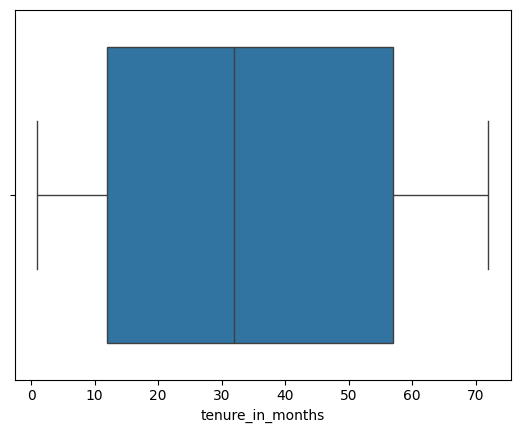

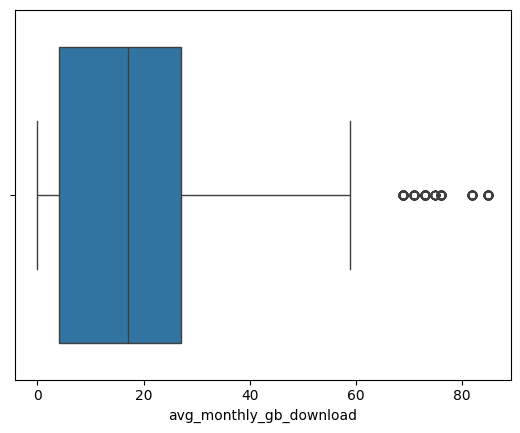

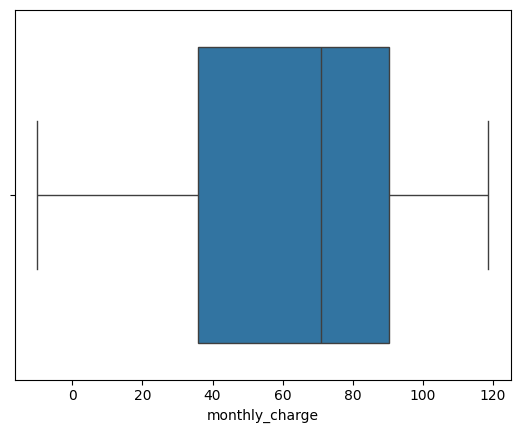

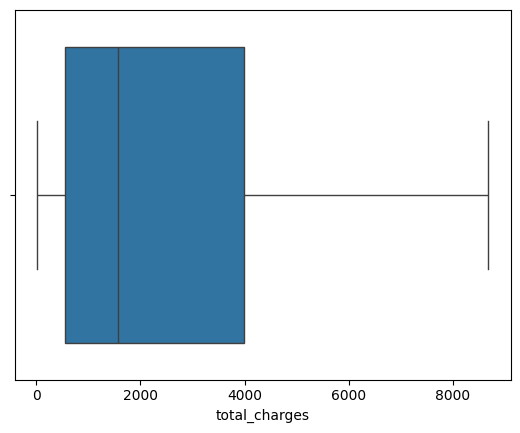

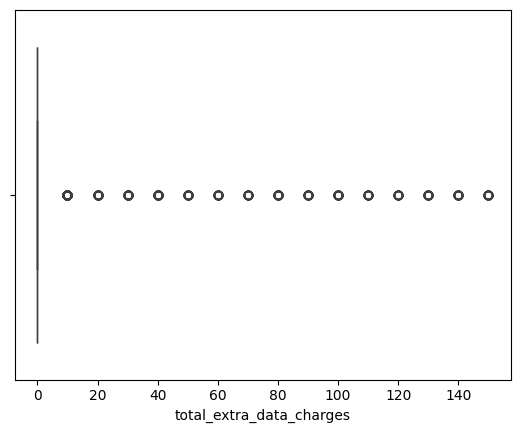

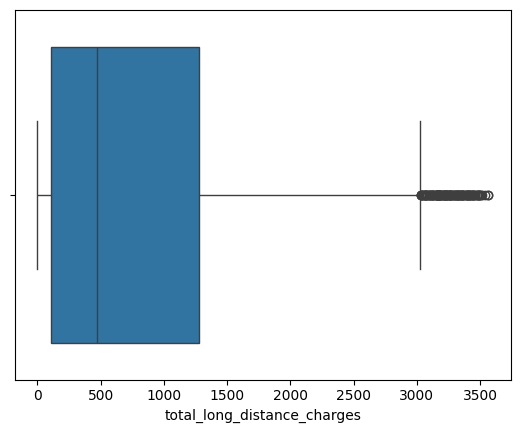

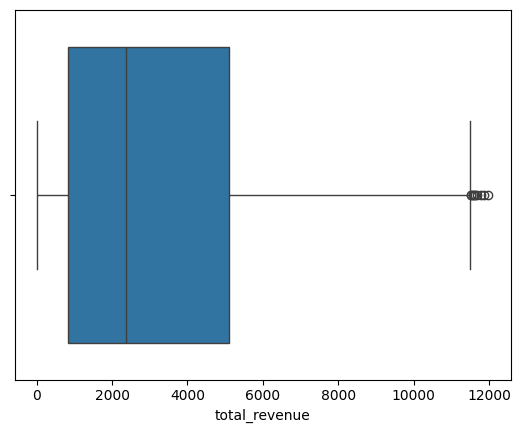

In [366]:
for var in df_new.columns:
    if var in ('viewer_id', 'gender', 'age', 'married', 'number_of_family_dependents', 'city', 'offer'
    'internet_service', 'interent_type','internet_service', 'online_security','online_backup','device_protection_plan','premium_tech_support',
               'streaming_tv','streaming_movies','streaming_music','unlimited_hi-res_streaming','subsctiption_type','paperless_billing','payment_method','viewer_status','total_refunds','number_of_referrals','offer','internet_type','subscription_type'):
        continue
    else:
        plt.figure(var)
        sns.boxplot(x = df_new[var])

In [367]:
# Closing all the figures to save memory
for var in df_new.columns:
    if var in ('viewer_id', 'gender', 'age', 'married', 'number_of_family_dependents', 'city', 'offer'
    'internet_service', 'interent_type','internet_service', 'online_security','online_backup','device_protection_plan','premium_tech_support',
               'streaming_tv','streaming_movies','streaming_music','unlimited_hi-res_streaming','subsctiption_type','paperless_billing','payment_method','viewer_status','total_refunds','number_of_referrals','offer','internet_type','subscription_type'):
        continue
    else:
        plt.close(var)

In [368]:
# Dropping the extreme outliers which are beyond 2.5 times the IQR range
# note this is only one way of handling outliers; if the data is normally distributed
# and outliers look OK, then this may not be appropriate
for var in df_new.columns:
    if var in ('viewer_id', 'gender', 'age', 'married', 'number_of_family_dependents', 'city', 'offer'
    'internet_service', 'interent_type','internet_service', 'online_security','online_backup','device_protection_plan','premium_tech_support',
               'streaming_tv','streaming_movies','streaming_music','unlimited_hi-res_streaming','subsctiption_type','paperless_billing','payment_method','viewer_status','total_refunds','number_of_referrals','offer','internet_type','subscription_type'):
        continue
    else:
        Q1 = df_new[var].quantile(0.25)
        Q3 = df_new[var].quantile(0.75)

        IQR = Q3 - Q1

        low_lim = Q1 - (2.5 * IQR)
        upp_lim = Q3 + (2.5 * IQR)

        print(var, low_lim, upp_lim)

        raw = df_new[~((df_new[var] < low_lim) | (df_new[var] > upp_lim))]

tenure_in_months -100.5 169.5
avg_monthly_gb_download -53.5 84.5
monthly_charge -100.70000000000003 226.90000000000003
total_charges -8090.60625 12633.31875
total_extra_data_charges 0.0 0.0
total_long_distance_charges -2816.35375 4198.891250000001
total_revenue -9839.092499999999 15779.707499999997


In [369]:
result = df_new.equals(raw)
print("DataFrames are identical:", result)


DataFrames are identical: True


##Scaling The Data


In [370]:
raw.isna().sum()

,0
viewer_id,0
gender,0
age,0
married,0
number_of_family_dependents,0
city,0
number_of_referrals,0
tenure_in_months,0
offer,0
internet_service,0


In [371]:
df_scaled = raw.copy()
print(df_scaled.columns)
cols_to_scale = df_scaled.select_dtypes(include=[np.number]).columns.tolist()
scaler = StandardScaler()
scaler.fit(df[cols_to_scale])
df_scaled[cols_to_scale] = scaler.transform(df[cols_to_scale])


df_scaled.isna().sum()

df_scaled.loc[df_new['internet_service'] == 'No', ['avg_monthly_gb_download']] = 0

df_preserved = df_scaled.copy(deep=True)

Index(['viewer_id', 'gender', 'age', 'married', 'number_of_family_dependents',
       'city', 'number_of_referrals', 'tenure_in_months', 'offer',
       'internet_service', 'internet_type', 'avg_monthly_gb_download',
       'online_security', 'online_backup', 'device_protection_plan',
       'premium_tech_support', 'streaming_tv', 'streaming_movies',
       'streaming_music', 'unlimited_hi-res_streaming', 'subscription_type',
       'paperless_billing', 'payment_method', 'monthly_charge',
       'total_charges', 'total_refunds', 'total_extra_data_charges',
       'total_long_distance_charges', 'total_revenue', 'viewer_status'],
      dtype='object')


## 2. Segmentation

In [372]:
# At this stage, we have a lot of features, so clustering on them directly may lead to increased complexity and
# possible overfitting. Hence, we can use a dimensionality reduction technique like PCA to reduce the number of
# features

In [373]:
print(df_scaled.columns)

Index(['viewer_id', 'gender', 'age', 'married', 'number_of_family_dependents',
       'city', 'number_of_referrals', 'tenure_in_months', 'offer',
       'internet_service', 'internet_type', 'avg_monthly_gb_download',
       'online_security', 'online_backup', 'device_protection_plan',
       'premium_tech_support', 'streaming_tv', 'streaming_movies',
       'streaming_music', 'unlimited_hi-res_streaming', 'subscription_type',
       'paperless_billing', 'payment_method', 'monthly_charge',
       'total_charges', 'total_refunds', 'total_extra_data_charges',
       'total_long_distance_charges', 'total_revenue', 'viewer_status'],
      dtype='object')


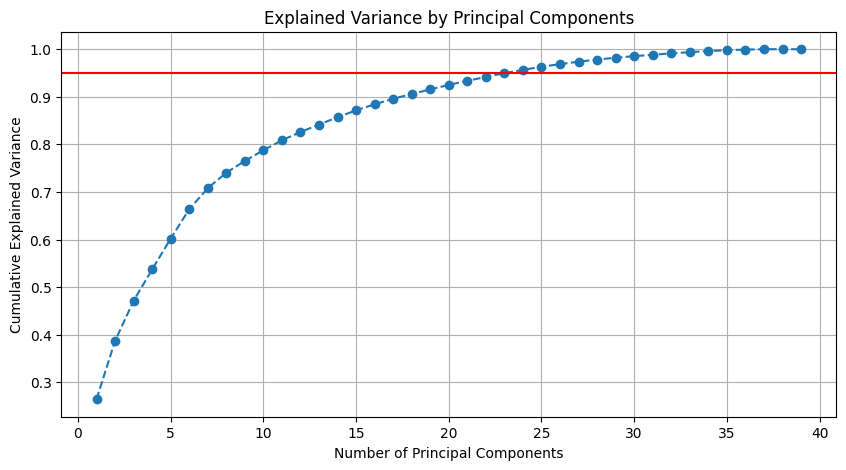

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39
0,-1.282309,0.387640,-0.339511,-0.385059,-0.166490,-0.172566,-0.734377,-0.102929,-0.536423,0.511089,0.752950,-0.379086,-0.331033,0.718311,0.442583,0.645192,0.355052,-0.089427,0.081214,0.823925,0.953179,0.102271,-0.095903,0.627988,-0.057037,-0.268249,0.232920,-0.317016,-0.432063,0.152794,-0.183580,0.184081,0.094367,-0.339965,-0.098650,-0.083157,0.021486,-1.776357e-15,-9.436896e-16
1,-2.456586,-0.152374,0.998500,0.556026,2.145155,3.933618,-0.270680,-0.569004,-0.574000,0.723343,-0.098112,1.069374,0.475235,0.066330,0.488246,0.168451,-0.070051,0.679286,-0.133034,-0.263047,-0.387824,-0.027026,-0.173980,-0.540035,-0.206208,0.577146,0.558535,-0.791167,-0.065152,-0.172470,-0.248630,0.214267,-0.077870,0.004993,0.029296,-0.818662,0.002530,-2.553513e-15,-2.914335e-15
2,-1.983456,1.430957,-0.602791,-0.338505,-0.172743,-0.122683,0.145135,0.652582,0.362456,0.335848,0.112134,-0.388295,0.400661,-0.522726,-0.094603,-0.014069,-0.025158,-0.524409,0.472494,-0.060956,-0.579424,0.319225,-0.109395,-0.407156,0.277580,-0.266203,0.240922,0.182470,-0.299202,-0.043468,0.206351,-0.256351,-0.090795,0.081276,0.027659,0.076313,0.004247,-3.330669e-16,-6.383782e-16
3,-0.571122,2.514644,0.935189,-1.150611,0.449808,-0.701076,0.247027,0.434248,0.090643,0.418561,-0.008412,0.203285,0.450963,-0.261399,0.028810,0.037845,0.046995,0.001663,0.717745,0.610320,-0.086952,0.259306,0.390164,0.771377,-0.168169,0.456126,-0.538504,0.066449,-0.306628,-0.033005,0.238589,-0.122205,-0.060663,0.025466,0.524940,0.003073,0.027629,0.000000e+00,-2.164935e-15
4,-1.567478,1.768539,0.844578,-1.316480,0.645040,-0.816695,-0.318616,0.485956,0.343591,0.380979,0.169216,-0.161909,-0.615185,-0.106390,0.661356,0.523797,0.136302,-0.428808,0.167551,-0.153589,1.094307,0.152144,-0.315880,0.328804,0.168887,-0.012517,-0.152505,-0.237206,-0.129481,-0.087136,-0.214966,0.174183,-0.008019,0.235654,-0.112190,0.082979,0.004437,-7.771561e-16,-7.771561e-16


In [374]:
# Selecting the categorical columns and removing viewer ID and viewer status
#selecting the numeric columns as well



categorical_cols = df_scaled.select_dtypes(include=['object']).columns
#categorical_cols = [col for col in categorical_cols if col not in ['viewer_id', 'viewer_status']]
categorical_cols = [col for col in categorical_cols if col not in ['viewer_id']]

numeric_cols = df_scaled.select_dtypes(include=['float64', 'int64']).columns

# One-hot encoding the categorical columns
encoded_features = pd.get_dummies(df_scaled[categorical_cols], drop_first=True)
# Keeping numeric columns as they are
final_df = pd.concat([df_scaled[numeric_cols], encoded_features], axis=1)







# Fitting PCA on the combined dataset (both numeric and encoded categorical features)
pca = PCA()
pca_result = pca.fit_transform(final_df)

# Convert the PCA result into a DataFrame for easier interpretation
pca_df = pd.DataFrame(pca_result, columns=[f'PC{i+1}' for i in range(pca_result.shape[1])])

# Visualize the explained variance
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
plt.axhline(y=0.95, color='r', linestyle='-')  # Highlight the 95% variance line
plt.title("Explained Variance by Principal Components")
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.grid(True)
plt.show()

# Check the first few rows of the PCA-transformed DataFrame
pca_df.head()



#for 95% variance, we can keep around 23 features


In [375]:
# Create a new PCA model with the number of components set to 10
pca_23 = PCA(n_components=23)

# Fit and transform the data to reduce the features to the top 23 principal components
pca_23_result = pca_23.fit_transform(pca_df)

# Convert the result into a DataFrame for easier interpretation
pca_23_df = pd.DataFrame(pca_23_result, columns=[f'PC{i+1}' for i in range(23)])

# Check the first few rows of the DataFrame with the top 23 components
pca_23_df.head()


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23
0,-1.282309,0.387640,-0.339511,-0.385059,-0.166490,-0.172566,-0.734377,-0.102929,-0.536423,0.511089,0.752950,-0.379086,-0.331033,0.718311,0.442583,0.645192,0.355052,-0.089427,0.081214,0.823925,0.953179,0.102271,-0.095903
1,-2.456586,-0.152374,0.998500,0.556026,2.145155,3.933618,-0.270680,-0.569004,-0.574000,0.723343,-0.098112,1.069374,0.475235,0.066330,0.488246,0.168451,-0.070051,0.679286,-0.133034,-0.263047,-0.387824,-0.027026,-0.173980
2,-1.983456,1.430957,-0.602791,-0.338505,-0.172743,-0.122683,0.145135,0.652582,0.362456,0.335848,0.112134,-0.388295,0.400661,-0.522726,-0.094603,-0.014069,-0.025158,-0.524409,0.472494,-0.060956,-0.579424,0.319225,-0.109395
3,-0.571122,2.514644,0.935189,-1.150611,0.449808,-0.701076,0.247027,0.434248,0.090643,0.418561,-0.008412,0.203285,0.450963,-0.261399,0.028810,0.037845,0.046995,0.001663,0.717745,0.610320,-0.086952,0.259306,0.390164
4,-1.567478,1.768539,0.844578,-1.316480,0.645040,-0.816695,-0.318616,0.485956,0.343591,0.380979,0.169216,-0.161909,-0.615185,-0.106390,0.661356,0.523797,0.136302,-0.428808,0.167551,-0.153589,1.094307,0.152144,-0.315880


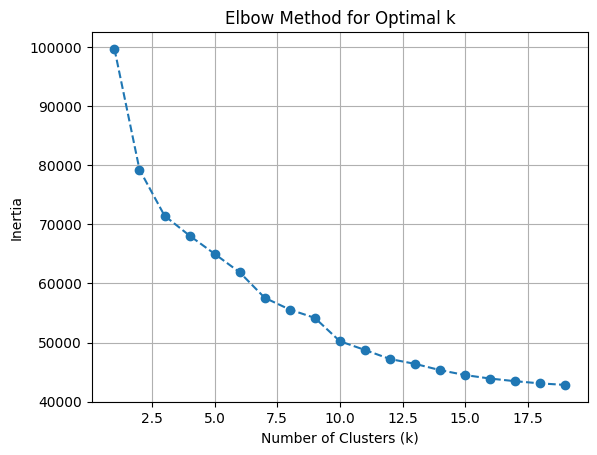

In [376]:
#using the elbow method to find the number of clusters.

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Calculate inertia (sum of squared distances to centroids) for different k values
inertia = []
for k in range(1, 20):  # Check k values from 1 to 10
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_23_df)  # Use the PCA result as input
    inertia.append(kmeans.inertia_)

# Plot the inertia values
plt.plot(range(1, 20), inertia, marker='o', linestyle='--')
plt.title("Elbow Method for Optimal k")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.grid(True)
plt.show()


In [377]:
from sklearn.cluster import KMeans

# Apply K-Means with the chosen number of clusters (k=3 in this case)
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(pca_23_df)  # Use the PCA results as input

# Assign the cluster labels to the dataset
pca_23_df['Cluster'] = kmeans.labels_

# Check the first few rows of the PCA results with cluster labels
pca_23_df.head()



,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,Cluster
0,-1.282309,0.387640,-0.339511,-0.385059,-0.166490,-0.172566,-0.734377,-0.102929,-0.536423,0.511089,0.752950,-0.379086,-0.331033,0.718311,0.442583,0.645192,0.355052,-0.089427,0.081214,0.823925,0.953179,0.102271,-0.095903,0
1,-2.456586,-0.152374,0.998500,0.556026,2.145155,3.933618,-0.270680,-0.569004,-0.574000,0.723343,-0.098112,1.069374,0.475235,0.066330,0.488246,0.168451,-0.070051,0.679286,-0.133034,-0.263047,-0.387824,-0.027026,-0.173980,2
2,-1.983456,1.430957,-0.602791,-0.338505,-0.172743,-0.122683,0.145135,0.652582,0.362456,0.335848,0.112134,-0.388295,0.400661,-0.522726,-0.094603,-0.014069,-0.025158,-0.524409,0.472494,-0.060956,-0.579424,0.319225,-0.109395,0
3,-0.571122,2.514644,0.935189,-1.150611,0.449808,-0.701076,0.247027,0.434248,0.090643,0.418561,-0.008412,0.203285,0.450963,-0.261399,0.028810,0.037845,0.046995,0.001663,0.717745,0.610320,-0.086952,0.259306,0.390164,0
4,-1.567478,1.768539,0.844578,-1.316480,0.645040,-0.816695,-0.318616,0.485956,0.343591,0.380979,0.169216,-0.161909,-0.615185,-0.106390,0.661356,0.523797,0.136302,-0.428808,0.167551,-0.153589,1.094307,0.152144,-0.315880,0


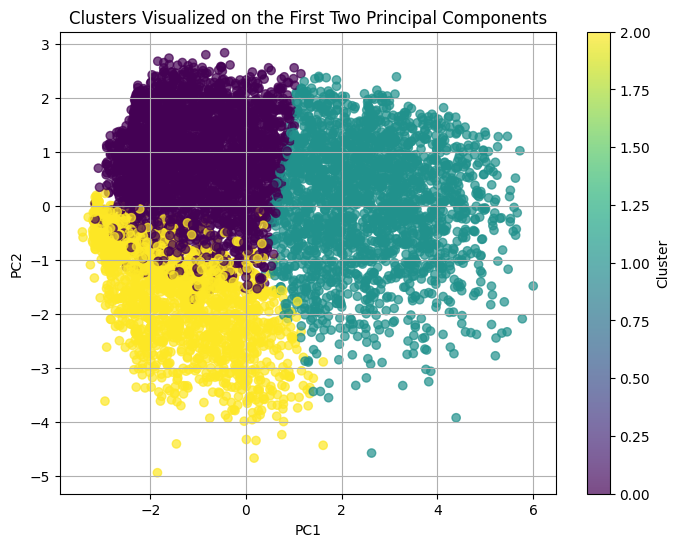

,0,0,0
PC1,-1.096032,2.568178,-1.368911
PC2,0.871132,0.057285,-1.669051
PC3,-0.271440,-0.067437,0.585216
PC4,-0.135797,0.013254,0.231035
PC5,0.133831,-0.037014,-0.196222
PC6,-0.045804,-0.001611,0.085919
PC7,-0.041986,-0.003407,0.081292
PC8,-0.010616,-0.076807,0.120335
PC9,-0.004303,0.010357,-0.005735
PC10,-0.030007,0.010492,0.041114


In [378]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.scatter(pca_23_df['PC1'], pca_23_df['PC2'],
            c=pca_23_df['Cluster'], cmap='viridis', alpha=0.7)
plt.title("Clusters Visualized on the First Two Principal Components")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.colorbar(label="Cluster")
plt.grid(True)
plt.show()







cluster_stats = pd.DataFrame()
for i in range(3):
    cluster_stats = pd.concat([cluster_stats, pca_23_df[pca_23_df['Cluster'] == i].mean()], axis=1)

cluster_stats


In [379]:
#Analysing what these clusters mean.

final_df['Cluster'] = pca_23_df['Cluster']


In [380]:
cluster_summary = final_df.groupby('Cluster').mean()
print(cluster_summary.head())



              age  number_of_family_dependents  number_of_referrals  \
Cluster                                                               
0        0.129539                    -0.299638            -0.383478   
1        0.021170                     0.045119             0.368986   
2       -0.264813                     0.488927             0.216810   

         tenure_in_months  avg_monthly_gb_download  monthly_charge  \
Cluster                                                              
0               -0.712893                -0.118296        0.161837   
1                1.014176                 0.069588        0.784523   
2               -0.028182                 0.125002       -1.326826   

         total_charges  total_refunds  total_extra_data_charges  \
Cluster                                                           
0            -0.536052      -0.013709                  0.004539   
1             1.276032       0.024770                  0.168649   
2            -0.695758   

In [381]:
# Calculate explained variance ratio

explained_variance_ratio = pca_23.explained_variance_ratio_

# Create feature importance DataFrame
feature_importance = pd.DataFrame(
    pca_23.components_.T,
    columns=[f'PC{i+1}' for i in range(len(pca_23.components_))]
)


In [382]:
# Calculate cumulative variance explained
cumulative_variance = np.cumsum(explained_variance_ratio)

print("Cumulative Variance Explained:")
print(cumulative_variance)

Cumulative Variance Explained:
[0.26436284 0.38671758 0.47119803 0.53713967 0.60186215 0.66372909
 0.70783818 0.74037243 0.76527401 0.78750741 0.80866603 0.82589608
 0.84167256 0.8570122  0.87159552 0.88419576 0.8958949  0.9059207
 0.91552497 0.92498581 0.93359439 0.94174648 0.94968308]


## 3. Prediction through Supervised Learning

In [383]:
# Defingina threshold to remove collinear
def remove_collinear_features(x, threshold):
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i+1):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)

            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
                #print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(col.values[0])

    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    x = x.drop(columns=drops)
    print('Removed Columns {}'.format(drops))
    return x

In [384]:
# Drop 'viewer_status' and 'viewer_id' columns
df_final = df_preserved.drop(columns=['viewer_status', 'viewer_id'])

# One-hot encode categorical columns
df_final = pd.get_dummies(df_final, drop_first=True)

# Remove collinear features with a threshold of 0.6
use_features = remove_collinear_features(df_final, 0.7)
print(use_features.head())


Removed Columns {'internet_type_None', 'internet_type_Fiber Optic', 'streaming_music_Yes', 'internet_service_Yes', 'unlimited_hi-res_streaming_Yes', 'total_revenue', 'total_charges'}
        age  number_of_family_dependents  number_of_referrals  \
0 -0.579437                    -0.491665            -0.006977   
1 -0.044980                    -0.491665            -0.668355   
2  0.192557                    -0.491665            -0.668355   
3  1.855312                    -0.491665            -0.337666   
4  1.677160                    -0.491665             0.323712   

   tenure_in_months  avg_monthly_gb_download  monthly_charge  total_refunds  \
0         -1.063833                -0.522784        0.018526      -0.256154   
1         -1.063833                -0.829454       -2.219714       4.461377   
2         -1.272474                 0.192780        0.285443      -0.256154   
3         -0.896919                -1.136124        1.060466      -0.256154   
4         -1.314203            

In [385]:
# computing VIF to confirm the high collinearity which exists between the features
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Convert True/False to 1/0 for all boolean columns in the DataFrame
final_df_onehot = df_final.replace({True: 1, False: 0})

X = final_df_onehot
# Ensure there are no missing or infinite values

vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

# Hence the first bunch has a lot of collinear features. We can remove them.
#We can also see the VIF score below for our features.
#Based on this, you need to remove these columns. Removed Columns {'total_charges', 'internet_type_None', 'internet_type_Fiber Optic', 'total_long_distance_charges', 'streaming_music_Yes', 'city_SJ', 'internet_service_Yes', 'unlimited_hi-res_streaming_Yes', 'total_revenue', 'married_Yes'}

<ipython-input-385-0ecc54f8a5eb>:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  final_df_onehot = df_final.replace({True: 1, False: 0})
/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,VIF,Column
6,inf,total_charges
7,inf,total_refunds
8,inf,total_extra_data_charges
9,inf,total_long_distance_charges
10,inf,total_revenue
21,56.502551,internet_service_Yes
24,11.604025,internet_type_None
3,8.202838,tenure_in_months
5,7.231097,monthly_charge
13,6.376239,city_SD


In [386]:
# create a cross-validation object with 5 folds
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder



##Model 1: Logistic Regression

In [387]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Encode the target variable if not already done
# Assign custom encoding
df_scaled['viewer_status'] = df_scaled['viewer_status'].replace({'Stayed': 1, 'Churned': 0})

# Verify the transformation
print(df_scaled['viewer_status'].value_counts())





# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    use_features, df_scaled['viewer_status'], test_size=0.2, random_state=42
)

# Create a logistic regression model
logreg_model = LogisticRegression(max_iter=1000)

# Perform cross-validation to get accuracy and log loss
accuracy_scores = cross_val_score(logreg_model, X_train, y_train, cv=5, scoring='accuracy')
mean_accuracy = accuracy_scores.mean()

# Train the model and evaluate on the test set
logreg_model.fit(X_train, y_train)
y_pred = logreg_model.predict(X_test)

# Compute evaluation metrics
test_accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f'Training set - Mean Cross-Validation Accuracy: {mean_accuracy:.2f}')
print(f'Test set - Accuracy: {test_accuracy:.2f}')
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


<ipython-input-387-2e5c2eef96fa>:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_scaled['viewer_status'] = df_scaled['viewer_status'].replace({'Stayed': 1, 'Churned': 0})


viewer_status
1    4719
0    1869
Name: count, dtype: int64
Training set - Mean Cross-Validation Accuracy: 0.85
Test set - Accuracy: 0.87

Confusion Matrix:
[[276  93]
 [ 74 875]]

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.75      0.77       369
           1       0.90      0.92      0.91       949

    accuracy                           0.87      1318
   macro avg       0.85      0.83      0.84      1318
weighted avg       0.87      0.87      0.87      1318



Feature Coefficients:
                        Feature  Coefficient
27   subscription_type_Two Year     2.437001
10                  married_Yes    -1.509318
2           number_of_referrals     1.487700
26   subscription_type_One Year     1.284562
14                offer_Offer A    -1.024263
3              tenure_in_months     0.903332
17                offer_Offer D     0.823226
1   number_of_family_dependents     0.600966
5                monthly_charge    -0.594457
16                offer_Offer C     0.513422
23     premium_tech_support_Yes     0.479214
29   payment_method_Credit Card     0.453284
12                      city_SF     0.404507
20          online_security_Yes     0.400444
18                offer_Offer E    -0.389701
30  payment_method_Mailed Check    -0.388256
13                      city_SJ     0.352636
28        paperless_billing_Yes    -0.331183
24             streaming_tv_Yes    -0.236226
0                           age    -0.201912
25         streaming_movies_Yes  

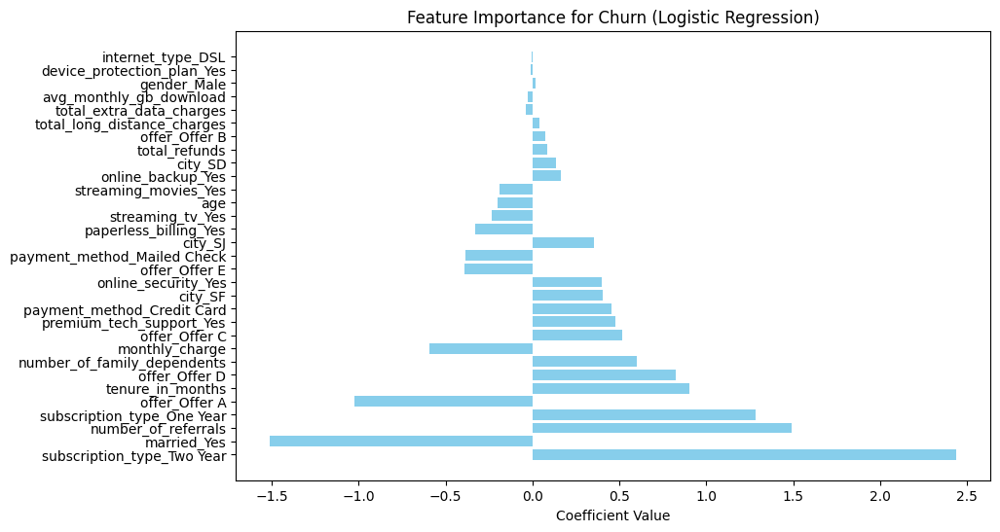

Top 5 factors affecting churn:
                       feature  coefficient
27  subscription_type_Two Year     2.437001
10                 married_Yes    -1.509318
2          number_of_referrals     1.487700
26  subscription_type_One Year     1.284562
14               offer_Offer A    -1.024263


In [388]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Get feature names and their corresponding coefficients
feature_names = X_train.columns
coefficients = logreg_model.coef_.flatten()

# Create a DataFrame for better visualization
coef_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
}).sort_values(by='Coefficient', key=abs, ascending=False)

print("Feature Coefficients:")
print(coef_df)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(coef_df['Feature'], coef_df['Coefficient'], color='skyblue')
plt.title('Feature Importance for Churn (Logistic Regression)')
plt.xlabel('Coefficient Value')
plt.show()

# Get feature names and coefficients
coefficients = pd.DataFrame({'feature': X_train.columns, 'coefficient': coefficients})

# Sort by absolute values of the coefficients and get the top 5
top_5_features = coefficients.reindex(coefficients.coefficient.abs().sort_values(ascending=False).index).head(5)

print("Top 5 factors affecting churn:")
print(top_5_features)


## Model 2: Random Forest Regression

In [389]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score

# Initialize and train the Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Perform cross-validation to get accuracy
rf_accuracy_scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='accuracy')
rf_mean_accuracy = rf_accuracy_scores.mean()

# Train the model and evaluate on the test set
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)

# Compute evaluation metrics for Random Forest
rf_test_accuracy = accuracy_score(y_test, rf_pred)
rf_conf_matrix = confusion_matrix(y_test, rf_pred)

print("**Random Forest Classifier Results:**")
print(f'Training set - Mean Cross-Validation Accuracy: {rf_mean_accuracy:.2f}')
print(f'Test set - Accuracy: {rf_test_accuracy:.2f}')
print("\nConfusion Matrix:")
print(rf_conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, rf_pred))


**Random Forest Classifier Results:**
Training set - Mean Cross-Validation Accuracy: 0.87
Test set - Accuracy: 0.88

Confusion Matrix:
[[263 106]
 [ 51 898]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.71      0.77       369
           1       0.89      0.95      0.92       949

    accuracy                           0.88      1318
   macro avg       0.87      0.83      0.84      1318
weighted avg       0.88      0.88      0.88      1318



In [390]:
# Get feature importances from the Random Forest model
rf_feature_importances = rf_model.feature_importances_

# Create a DataFrame to sort and display the top features
rf_features_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': rf_feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the top 5 features
print("**Top 5 Features from Random Forest:**")
print(rf_features_df.head(5))


**Top 5 Features from Random Forest:**
                        Feature  Importance
3              tenure_in_months    0.205380
8   total_long_distance_charges    0.103842
5                monthly_charge    0.101114
27   subscription_type_Two Year    0.075511
2           number_of_referrals    0.071246


## 3. Gradient Boosting Classifier


In [391]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize and train Gradient Boosting Classifier
gb_model = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Perform cross-validation to get accuracy
gb_accuracy_scores = cross_val_score(gb_model, X_train, y_train, cv=5, scoring='accuracy')
gb_mean_accuracy = gb_accuracy_scores.mean()

# Train the model and evaluate on the test set
gb_model.fit(X_train, y_train)
gb_pred = gb_model.predict(X_test)

# Compute evaluation metrics for Gradient Boosting
gb_test_accuracy = accuracy_score(y_test, gb_pred)
gb_conf_matrix = confusion_matrix(y_test, gb_pred)

print("**Gradient Boosting Classifier Results:**")
print(f'Training set - Mean Cross-Validation Accuracy: {gb_mean_accuracy:.2f}')
print(f'Test set - Accuracy: {gb_test_accuracy:.2f}')
print("\nConfusion Matrix:")
print(gb_conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, gb_pred))


**Gradient Boosting Classifier Results:**
Training set - Mean Cross-Validation Accuracy: 0.87
Test set - Accuracy: 0.88

Confusion Matrix:
[[272  97]
 [ 55 894]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.74      0.78       369
           1       0.90      0.94      0.92       949

    accuracy                           0.88      1318
   macro avg       0.87      0.84      0.85      1318
weighted avg       0.88      0.88      0.88      1318



In [392]:
# Get feature importances from the Gradient Boosting model
gb_feature_importances = gb_model.feature_importances_

# Create a DataFrame to sort and display the top features
gb_features_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': gb_feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the top 5 features
print("**Top 5 Features from Gradient Boosting:**")
print(gb_features_df.head(5))


**Top 5 Features from Gradient Boosting:**
                       Feature  Importance
3             tenure_in_months    0.457158
5               monthly_charge    0.111803
27  subscription_type_Two Year    0.110766
2          number_of_referrals    0.107027
26  subscription_type_One Year    0.070061


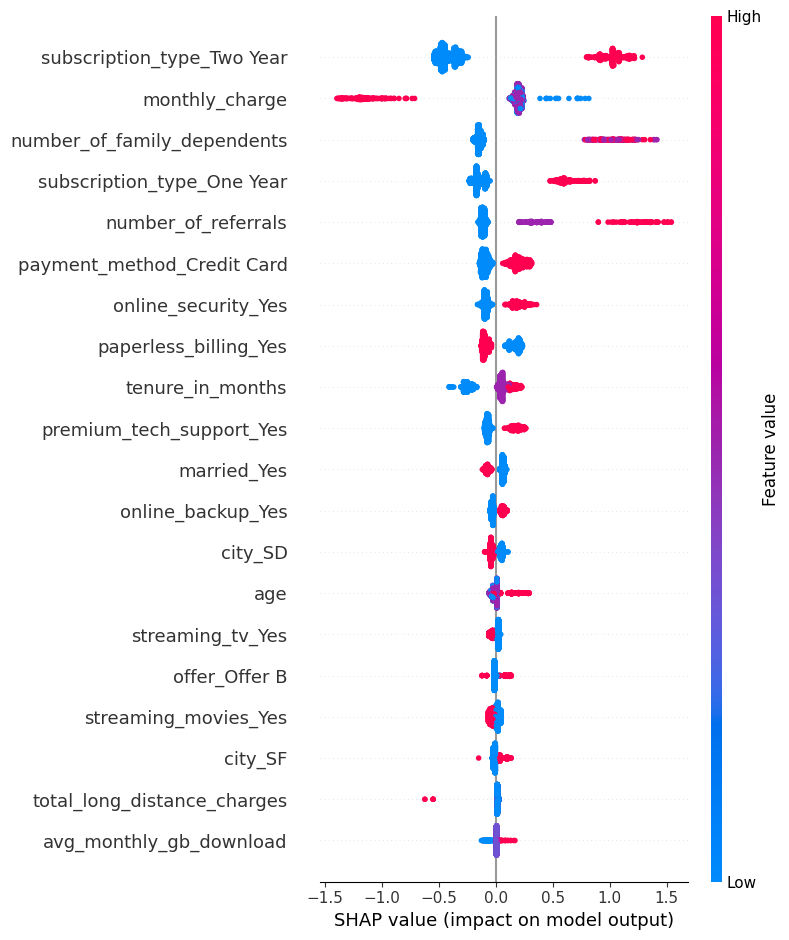

In [393]:
import shap


X_train_encoded = pd.get_dummies(X_train)
X_test_encoded = pd.get_dummies(X_test)

# Convert all boolean columns to integers (0 or 1)
X_train_encoded = X_train_encoded.astype(int)
X_test_encoded = X_test_encoded.astype(int)


# Align test and train features to ensure compatibility
X_train_encoded, X_test_encoded = X_train_encoded.align(X_test_encoded, join='left', axis=1, fill_value=0)

explainer = shap.Explainer(gb_model, X_train_encoded)
shap_values = explainer(X_test_encoded)
shap.summary_plot(shap_values, X_test_encoded)
